In [2]:
# install required libraries
cd(@__DIR__)
using Pkg
# Pkg.activate(".")
# Pkg.add("DataFrames")
# Pkg.add("Plots")
# Pkg.add("StatsBase")
# Pkg.add("CSV")
# Pkg.add("Downloads")
# Pkg.add("Arrow")
# Pkg.add("FreqTables")
# Pkg.add("SHA")
# Pkg.add("Chain")

  Activating new environment at `~/ManningLiveProjects/julia/adult-dataset/Project.toml`
    Updating registry at `~/.julia/registries/General`
   Resolving package versions...
   Installed DataFrames ───── v1.2.2
   Installed DataStructures ─ v0.18.10
    Updating `~/ManningLiveProjects/julia/adult-dataset/Project.toml`
  [a93c6f00] + DataFrames v1.2.2
    Updating `~/ManningLiveProjects/julia/adult-dataset/Manifest.toml`
  [34da2185] + Compat v3.32.0
  [a8cc5b0e] + Crayons v4.0.4
  [9a962f9c] + DataAPI v1.7.0
  [a93c6f00] + DataFrames v1.2.2
  [864edb3b] + DataStructures v0.18.10
  [e2d170a0] + DataValueInterfaces v1.0.0
  [59287772] + Formatting v0.4.2
  [41ab1584] + InvertedIndices v1.0.0
  [82899510] + IteratorInterfaceExtensions v1.0.0
  [e1d29d7a] + Missings v1.0.0
  [bac558e1] + OrderedCollections v1.4.1
  [2dfb63ee] + PooledArrays v1.2.1
  [08abe8d2] + PrettyTables v1.1.0
  [189a3867] + Reexport v1.1.0
  [a2af1166] + SortingAlgorithms v1.0.1
  [3783bdb8] + TableTraits v1.0.1
 

In [ ]:
] instantiate

In [3]:
import Downloads
import SHA
using Arrow
using Chain
using DataFrames, Random, DelimitedFiles, CSV
using Plots
using FreqTables
using Statistics
using StatsBase
using SHA

┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1342
┌ Info: Precompiling FreqTables [da1fdf0e-e0ff-5433-a45f-9bb5ff651cb1]
└ @ Base loading.jl:1342


In [5]:
function f()    
    if isfile("./data/adult.data") == false
        Downloads.download("https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data","./data/adult.data")
        Downloads.download("https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names","./data/adult.names")
    end
end

f()

"./data/adult.names"

In [6]:
# compute hash
expected = bytes2hex([0xee, 0x86, 0xbb, 0xe5, 0x56,
0x57, 0x8f, 0x70, 0x9a, 0xe0,
0xfd, 0x00, 0x2a, 0xc5, 0x8a,
0xc9, 0x37, 0x26, 0x48, 0x2f])

#open downloaded file and compute hash
open("./data/adult.data") do f
    result = bytes2hex(sha1(f))
    println("hash match: ", result == expected, " = ", result)    
end

hash match: true = ee86bbe556578f709ae0fd002ac58ac93726482f


Load data into dataframe

In [151]:
#load into DataFramedf = DataFrame(readdlm("housing.data"), [:CRIM,:ZN,:INDUS,:CHAS,:NOX,:RM,:AGE,:DIS,:RAD,:TAX,:PTRATIO,:B,:LSTAT,:MEDV])
df = CSV.read("./data/adult.data", DataFrame; header=[:age, :workclass, :fnlwgt, :education, :educationNum, :maritalStatus, 
 :occupation, :relationship, :race, :sex, :capitalGain, :capitalLoss, :hoursPerWeek, :nativeCountry, :incomeThreshold], 
ignorerepeated=true,delim=", ", threaded=false, tasks=1, missingstrings=["?"])

# note the space before the question mark for missing string!

,age,workclass,fnlwgt,education,educationNum,maritalStatus,occupation,relationship,race,sex,capitalGain,capitalLoss,hoursPerWeek,nativeCountry
,Int64,String?,Int64,String,Int64,String,String?,String,String,String,Int64,Int64,Int64,String?
1,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
2,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
3,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
4,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
5,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba
6,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States
7,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica
8,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States
9,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States


In [152]:
describe(df)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,age,38.5816,17,37.0,90,0,Int64
2,workclass,,Federal-gov,,Without-pay,1836,"Union{Missing, String}"
3,fnlwgt,1.89778e5,12285,178356.0,1484705,0,Int64
4,education,,10th,,Some-college,0,String
5,educationNum,10.0807,1,10.0,16,0,Int64
6,maritalStatus,,Divorced,,Widowed,0,String
7,occupation,,Adm-clerical,,Transport-moving,1843,"Union{Missing, String}"
8,relationship,,Husband,,Wife,0,String
9,race,,Amer-Indian-Eskimo,,White,0,String


Adjust col and row count to 200 , 20

In [153]:
ENV["COLUMNS"]= 200
ENV["LINES"]= 20

df

,age,workclass,fnlwgt,education,educationNum,maritalStatus,occupation,relationship,race,sex,capitalGain,capitalLoss,hoursPerWeek,nativeCountry
,Int64,String?,Int64,String,Int64,String,String?,String,String,String,Int64,Int64,Int64,String?
1,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
2,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
3,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
4,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
5,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba
6,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States
7,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica
8,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States
9,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States


Exclude fnlwgt column from analysis

In [154]:
select!(df, Not(:fnlwgt))

,age,workclass,education,educationNum,maritalStatus,occupation,relationship,race,sex,capitalGain,capitalLoss,hoursPerWeek,nativeCountry,incomeThreshold
,Int64,String?,String,Int64,String,String?,String,String,String,Int64,Int64,Int64,String?,String
1,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
2,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
3,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
4,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
5,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
6,37,Private,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
7,49,Private,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
8,52,Self-emp-not-inc,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
9,31,Private,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K


Get list of categorical variables

In [155]:
categories = names(df, Union{String, Missing})

9-element Vector{String}:
 "workclass"
 "education"
 "maritalStatus"
 "occupation"
 "relationship"
 "race"
 "sex"
 "nativeCountry"
 "incomeThreshold"

In [156]:
#from solution
foreach(name -> println("\n", proptable(df, name) |> sort), categories)


9-element Named Vector{Float64}
workclass        │ 
─────────────────┼────────────
Never-worked     │ 0.000214981
Without-pay      │ 0.000429962
Federal-gov      │   0.0294831
Self-emp-inc     │   0.0342741
State-gov        │   0.0398636
missing          │   0.0563865
Local-gov        │   0.0642794
Self-emp-not-inc │   0.0780381
Private          │     0.69703

16-element Named Vector{Float64}
education    │ 
─────────────┼───────────
Preschool    │ 0.00156629
1st-4th      │ 0.00515955
5th-6th      │   0.010227
Doctorate    │  0.0126839
12th         │  0.0132981
9th          │  0.0157858
Prof-school  │  0.0176899
7th-8th      │  0.0198397
10th         │  0.0286539
Assoc-acdm   │  0.0327693
11th         │  0.0360861
Assoc-voc    │  0.0424434
Masters      │  0.0529161
Bachelors    │   0.164461
Some-college │   0.223918
HS-grad      │   0.322502

7-element Named Vector{Float64}
maritalStatus         │ 
──────────────────────┼────────────
Married-AF-spouse     │ 0.000706367
Married-spouse-

In [169]:
# histogram utility function
hist(col) =
    histogram(df[!,col], title=col)

hist (generic function with 1 method)

Show bar plots

In [158]:
# Data is passed to the bar function to create a barplot
function bar_helper(column_name)
    gb = groupby(df, column_name, sort=true)
    agg = combine(gb, nrow)
    #println(agg.nrow)  
    bar(string.(agg[!, column_name]), agg.nrow, xlabel=column_name,
        legend=false, xrotation = 45)
end

bar_helper (generic function with 1 method)

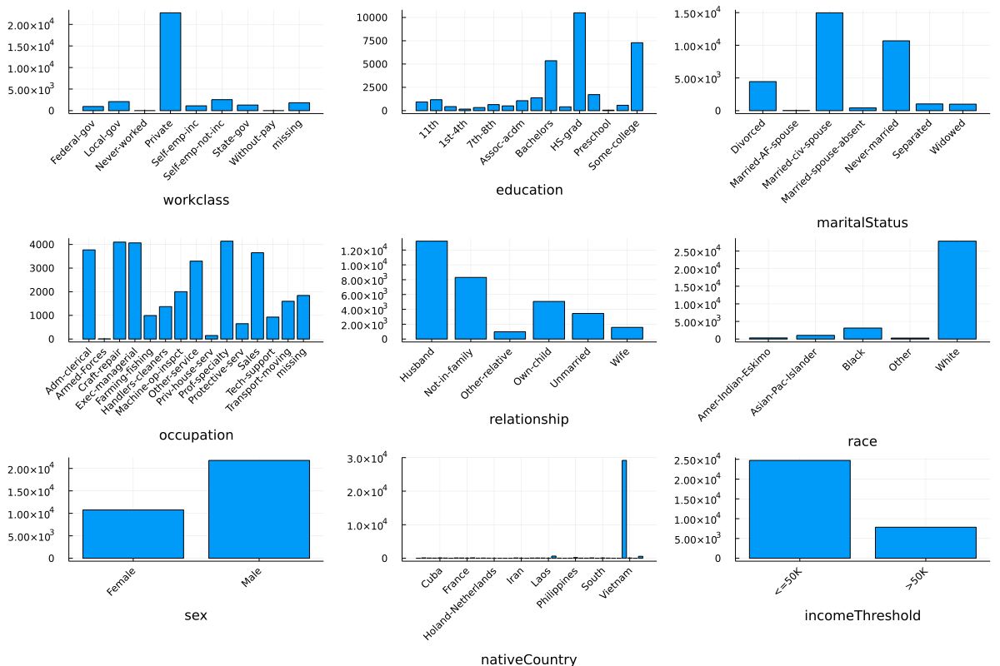

In [159]:
plot(map(x -> bar_helper(x), categories)..., layout=grid(3, 3),  size=(1200,800))

Convert all other countries to non-us

In [160]:
dropmissing!(df, :nativeCountry)

,age,workclass,education,educationNum,maritalStatus,occupation,relationship,race,sex,capitalGain,capitalLoss,hoursPerWeek,nativeCountry,incomeThreshold
,Int64,String?,String,Int64,String,String?,String,String,String,Int64,Int64,Int64,String,String
1,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
2,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
3,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
4,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
5,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
6,37,Private,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
7,49,Private,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
8,52,Self-emp-not-inc,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
9,31,Private,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K


In [161]:
#df.nativeCountry[Not("United-States")] .= "not-United-States";
df[:, [:nativeCountry]] .= ifelse.(df[!, [:nativeCountry]] .!= "United-States" , "non-United-States", df[!,[:nativeCountry]])

,nativeCountry
,String
1,United-States
2,United-States
3,United-States
4,United-States
5,non-United-States
6,United-States
7,non-United-States
8,United-States
9,United-States


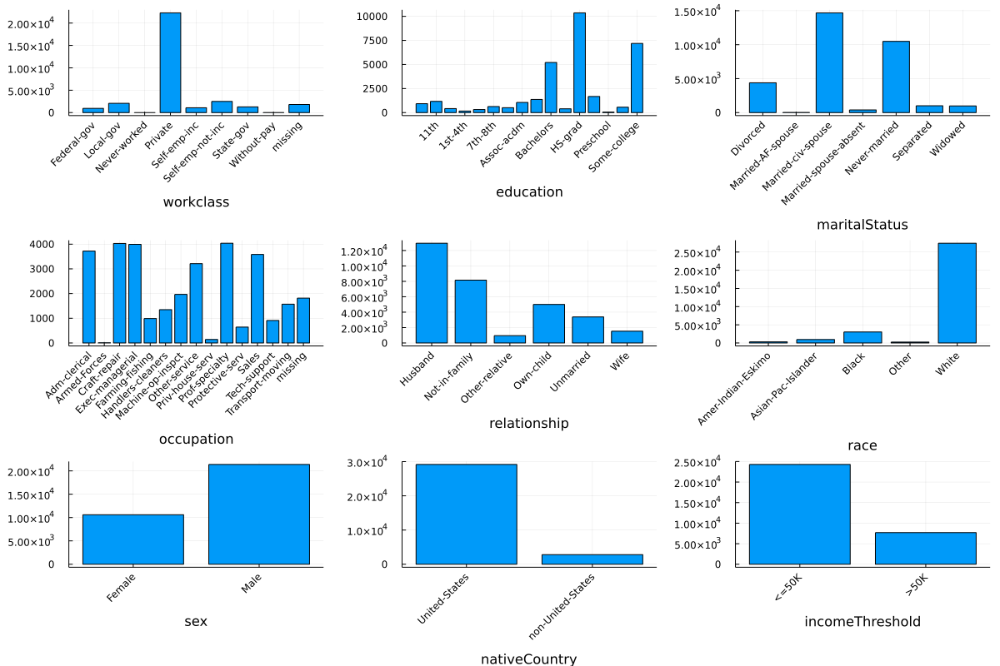

In [162]:
plot(map(x -> bar_helper(x), categories)..., layout=grid(3, 3),  size=(1200,800))

In [163]:
freqtable(df.nativeCountry)

2-element Named Vector{Int64}
Dim1              │ 
──────────────────┼──────
United-States     │ 29170
non-United-States │  2808

In [164]:
#Produce two-way table to learn more about relation between 'maritial_status' and 'relationship' features
@chain df begin
    groupby([:maritalStatus, :relationship])
    combine(nrow)
    unstack(:maritalStatus, :relationship, :nrow)
end

,maritalStatus,Not-in-family,Own-child,Unmarried,Other-relative,Husband,Wife
,String,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?
1,Never-married,4611,4428,859,590,missing,missing
2,Married-civ-spouse,17,92,missing,123,12938,1522
3,Divorced,2381,326,1579,108,missing,missing
4,Married-spouse-absent,196,44,129,28,missing,missing
5,Separated,409,99,442,55,missing,missing
6,Married-AF-spouse,missing,1,missing,1,9,12
7,Widowed,542,15,375,47,missing,missing


Historgam continuous

In [165]:
continuous = names(df, Int)

5-element Vector{String}:
 "age"
 "educationNum"
 "capitalGain"
 "capitalLoss"
 "hoursPerWeek"

In [171]:
plot(map(x -> hist(x), continuous)..., layout=grid(5, 1),  size=(800,500))


In [ ]:
# Check how many 'capital_gain' observations are equal to 0
mean(df.capital_gain .== 0)

In [ ]:
# Check how many 'capital_loss' observations are equal to 0
mean(df.capital_loss .== 0)

In [ ]:
# Check the same mean as above, but grouped by `target`
@chain df begin
    groupby(:target)
    combine([:capital_gain, :capital_loss] .=>
            (x -> mean(x .== 0)) .=>
            [:freq0_capital_gain, :freq0_capital_loss])
end

In [ ]:
# Save clean dataset as Arrow file
Arrow.write("adult_train.arrow", df)